# Lewagon X Femtasy
## Exploratory Data Analysis

### Hard Coded Info

In [1]:
str(get_ipython())

'<ipykernel.zmqshell.ZMQInteractiveShell object at 0x7fcd3be7b6d0>'

In [2]:
# Dictionary to translate content_type integer into Category
content_type_dict = {1 : 'Soul',
                     2 : 'Sounds',
                     3 : 'Stories',
                     4 : 'Series',
                    }

In [3]:
user_kinks_10 = ['In public', # not in df
                 'At home',
                 'With a stranger',
                 'Authority',
                 'BDSM',
                 'Roleplay',
                 'Quickie',
                 'Group Sex',
                 'Queer',
                 'Toys', # not in df
]

### Import Libraries

In [4]:
import pandas as pd
import numpy as np
from icecream import ic
import os
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### Read data

In [5]:
path_data = os.path.join('..','raw_data', 'raw_data.xlsx')
df = pd.read_excel(path_data)

In [6]:
df.head()

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,Unnamed: 11,Content Types,Story Duration,Play Duration
0,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296
1,Long-Term Active,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,Guided Masturbation,Intense,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60
2,Long-Term Active,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,Guided Masturbation,Intense,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60
3,Long-Term Active,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60
4,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458


### Clean data

In [7]:
# Rename unnamed column to 'fantasies'
df = df.rename(columns={'Unnamed: 11': 'fantasies'})

In [8]:
df.shape

(12026, 15)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12026 entries, 0 to 12025
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Status Labels           12026 non-null  object        
 1   Anonymized ID           12026 non-null  object        
 2   Anonymized Story IDs    12026 non-null  int64         
 3   Anonymized Voice IDs    12026 non-null  int64         
 4   Voice Type              12026 non-null  object        
 5   Genre                   12026 non-null  object        
 6   Language Intensity      12026 non-null  object        
 7   Story Listen Timestamp  12026 non-null  datetime64[ns]
 8   Session Breakups        12026 non-null  object        
 9   Story Release Date      12026 non-null  datetime64[ns]
 10  Kinkiness Score         12026 non-null  int64         
 11  fantasies               12026 non-null  object        
 12  Content Types           12026 non-null  int64 

In [10]:
df.describe()

,Anonymized Story IDs,Anonymized Voice IDs,Kinkiness Score,Content Types,Story Duration,Play Duration
count,12026.000000,12026.000000,12026.000000,12026.000000,12026.000000,12026.000000
mean,24926.610344,1524.884084,419.381507,2.585731,599.312074,292.742974
std,10801.451522,1380.309823,113.787839,0.622790,320.663756,297.423676
min,144.000000,120.000000,1.000000,1.000000,85.000000,60.000000
25%,20991.000000,336.000000,401.000000,2.000000,358.000000,60.000000
50%,30144.000000,1104.000000,501.000000,3.000000,557.000000,170.000000
75%,33168.000000,3096.000000,501.000000,3.000000,787.000000,436.000000
max,34128.000000,4320.000000,510.000000,4.000000,2240.000000,1805.000000


In [11]:
# Split 'Session Breakups' into single parts
df['Session Breakups_date'] = df['Session Breakups'].str[:9]
df['Session Breakups_breakup'] = df['Session Breakups'].str.slice(start=10)

In [12]:
# Split Kinkiness Score
def split_score(df):
    def user_kinks(value):
        if value >100:
            return str(value)[1:]
        else:
            return 0
    df['user_intensity'] = pd.to_numeric(df['Kinkiness Score'].apply(lambda x: str(x)[0]))
    df['user_kinks'] = pd.to_numeric(df['Kinkiness Score'].apply(lambda x: user_kinks(x)))
    
    return df

In [13]:
df = split_score(df)

In [14]:
# 
def voice_popularity(df):
    df['voice_popularity'] = df['Anonymized Voice IDs'].apply(lambda x: df['Anonymized Voice IDs'].value_counts()[x])
    return df

check for row-duplicates and remove them

In [15]:
df[df.duplicated()]

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks
85,Long-Term Active,6142ca2b724aa3a3b2209065e97482ede5673751463831...,6828,1104,anonym,Sex Sounds,Intense,2022-07-15 14:52:44,2022-7-15-Early,2019-04-26 10:30:46,402,Quickie,2,207,207,2022-7-15,Early,4,2
86,Long-Term Active,6142ca2b724aa3a3b2209065e97482ede5673751463831...,6828,1104,anonym,Sex Sounds,Intense,2022-07-15 14:52:44,2022-7-15-Early,2019-04-26 10:30:46,402,Quickie,2,207,207,2022-7-15,Early,4,2
117,Long-Term Active,2cdabe4def61d6f60bf9aef63a691c82c769645a1139e3...,6828,1104,anonym,Sex Sounds,Intense,2022-07-15 22:24:23,2022-7-15-Late Peak,2019-04-26 10:30:46,402,Quickie,2,207,148,2022-7-15,Late Peak,4,2
118,Long-Term Active,2cdabe4def61d6f60bf9aef63a691c82c769645a1139e3...,6828,1104,anonym,Sex Sounds,Intense,2022-07-15 22:24:23,2022-7-15-Late Peak,2019-04-26 10:30:46,402,Quickie,2,207,148,2022-7-15,Late Peak,4,2
124,Long-Term Active,6c586b2a574b64a474856d7e5c49f118fd487f944356e9...,31224,1104,anonym,Sex Sounds,Intense,2022-07-15 11:47:27,2022-7-15-Early,2022-01-19 11:08:37,502,At home,2,617,347,2022-7-15,Early,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11805,Short-Term Active,9e97ec1a25c35324098829157ecf7fcb243feefc5b4b64...,27024,1080,male,Phone Sex,Rough,2022-07-17 13:48:33,2022-7-17-Early,2021-06-03 15:05:30,501,At home,3,559,559,2022-7-17,Early,5,1
11808,Short-Term Active,4b46eb2de01deaa45ee5ff444baccf819883275c7e6c10...,32544,2808,male,Phone Sex,Rough,2022-07-17 19:31:18,2022-7-17-First Peak,2022-06-15 13:00:00,301,Group sex,3,849,60,2022-7-17,First Peak,3,1
11815,Short-Term Active,9ac617b17203443d82cf83bc754cf82ea8f2c13296cb9f...,25920,3000,male,Phone Sex,Rough,2022-07-17 22:31:31,2022-7-17-Late Peak,2020-10-29 17:00:00,201,Phone,3,459,418,2022-7-17,Late Peak,2,1
11824,Short-Term Active,8404d10bb93fab248f899e1d2762b0c7ede963dae6057b...,32136,2808,male,Phone Sex,Rough,2022-07-18 11:09:56,2022-7-18-Early,2022-04-01 13:00:00,101,Doggy style,3,307,60,2022-7-18,Early,1,1


In [16]:
df = df.drop_duplicates()
df

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks
0,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak,4,1
1,Long-Term Active,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,Guided Masturbation,Intense,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early,4,1
2,Long-Term Active,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,Guided Masturbation,Intense,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak,2,1
3,Long-Term Active,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1
4,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12021,Short-Term Active,e6b85759c4abeb56e1946bbb4c94be63a0842a256cae9f...,27192,1248,male,Phone Sex,Soft,2022-07-17 00:03:08,2022-7-16-Late Peak,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-16,Late Peak,2,1
12022,Short-Term Active,4e008ddd59934e961eab4ccf42a3c16fd0f9795ba40ea5...,27192,1248,male,Phone Sex,Soft,2022-07-18 14:56:26,2022-7-18-Early,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-18,Early,2,1
12023,Short-Term Active,a747ec6ab408692145f8435da174c10b3cd888459287c7...,22224,336,male,Phone Sex,Soft,2022-07-19 00:16:38,2022-7-18-Late Peak,2020-11-15 17:00:00,201,At home,3,490,489,2022-7-18,Late Peak,2,1
12024,Short-Term Active,0d4aa3734ecdd466e2aa6a3c5b9ca414aef1eca60e82a2...,27192,1248,male,Phone Sex,Soft,2022-07-19 13:48:53,2022-7-19-Early,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-19,Early,2,1


### Data Analysis

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11592 entries, 0 to 12025
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Status Labels             11592 non-null  object        
 1   Anonymized ID             11592 non-null  object        
 2   Anonymized Story IDs      11592 non-null  int64         
 3   Anonymized Voice IDs      11592 non-null  int64         
 4   Voice Type                11592 non-null  object        
 5   Genre                     11592 non-null  object        
 6   Language Intensity        11592 non-null  object        
 7   Story Listen Timestamp    11592 non-null  datetime64[ns]
 8   Session Breakups          11592 non-null  object        
 9   Story Release Date        11592 non-null  datetime64[ns]
 10  Kinkiness Score           11592 non-null  int64         
 11  fantasies                 11592 non-null  object        
 12  Content Types     

In [18]:
df[df['user_kinks'].isnull()]

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks


In [19]:
df.describe()

,Anonymized Story IDs,Anonymized Voice IDs,Kinkiness Score,Content Types,Story Duration,Play Duration,user_intensity,user_kinks
count,11592.000000,11592.000000,11592.000000,11592.000000,11592.000000,11592.000000,11592.000000,11592.000000
mean,25241.127329,1519.585921,420.411318,2.592046,606.707039,294.461525,4.200569,1.601277
std,10684.723115,1395.666472,114.226171,0.624451,320.004087,298.722726,1.113547,0.985579
min,144.000000,120.000000,1.000000,1.000000,85.000000,60.000000,1.000000,0.000000
25%,21792.000000,336.000000,401.000000,2.000000,358.000000,60.000000,4.000000,1.000000
50%,30396.000000,1104.000000,501.000000,3.000000,557.000000,169.000000,5.000000,1.000000
75%,33252.000000,3096.000000,501.000000,3.000000,800.000000,442.000000,5.000000,2.000000
max,34128.000000,4320.000000,510.000000,4.000000,2240.000000,1805.000000,5.000000,10.000000


In [20]:
df['Session Breakups_breakup'].value_counts()

Early         4563
Late Peak     2966
First Peak    2196
OFF           1867
Name: Session Breakups_breakup, dtype: int64

### Data facts

In [21]:
user_count = df['Anonymized ID'].nunique()
actor_count = df['Anonymized Voice IDs'].nunique()
#actor_count

In [22]:
#sns.pairplot(data=df, hue='fantasies')

In [23]:
#sns.pairplot(data=df, hue='Anonymized Story IDs', palette='rocket')

In [24]:
#sns.pairplot(data=df, hue='Anonymized Voice IDs', palette='rocket')

In [25]:
#sns.pairplot(data=df, hue='Content Types', palette='rocket')

In [26]:
#sns.pairplot(data=df, hue='Story Duration', palette='rocket')

In [27]:
#sns.pairplot(data=df, hue='Play Duration', palette='rocket')

In [28]:
#sns.pairplot(data=df, hue='user_intensity', palette='rocket')

In [29]:
#sns.pairplot(data=df, hue='user_kinks', palette='rocket')

In [30]:
#df.corr().round(2)

<AxesSubplot:>

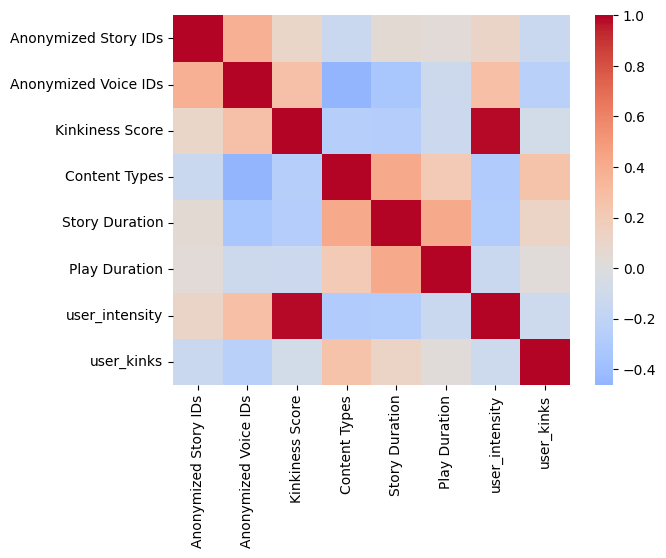

In [31]:
sns.heatmap(df.corr(), center=0, cmap='coolwarm')

<AxesSubplot:>

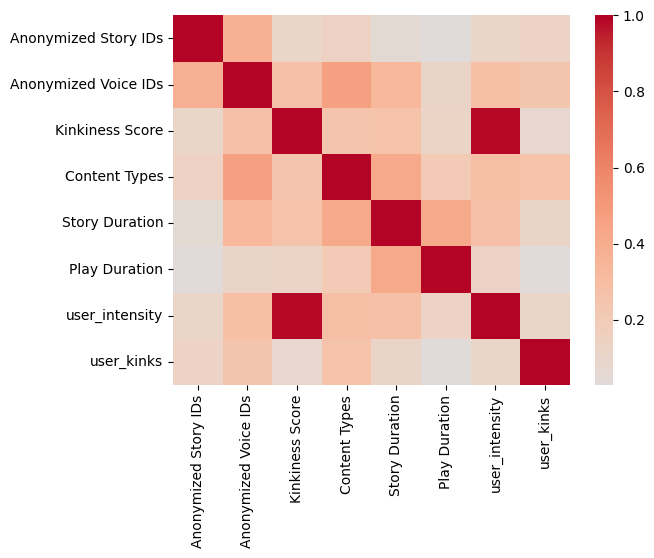

In [32]:
sns.heatmap(df.corr().abs(), center=0, cmap='coolwarm')

In [33]:
df.head()

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks
0,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak,4,1
1,Long-Term Active,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,Guided Masturbation,Intense,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early,4,1
2,Long-Term Active,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,Guided Masturbation,Intense,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak,2,1
3,Long-Term Active,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1
4,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak,4,1


In [34]:
# 'Soft' < 'Intense' < 'Rough'
df['Language Intensity'].unique()

lang_intensity_dict = {'Soft': 1, 'Intense': 2, 'Rough': 3}
#df['Language Intensity'] = df['Language Intensity'].str.replace(lang_intensity_dict)
df

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks
0,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak,4,1
1,Long-Term Active,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,Guided Masturbation,Intense,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early,4,1
2,Long-Term Active,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,Guided Masturbation,Intense,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak,2,1
3,Long-Term Active,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1
4,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12021,Short-Term Active,e6b85759c4abeb56e1946bbb4c94be63a0842a256cae9f...,27192,1248,male,Phone Sex,Soft,2022-07-17 00:03:08,2022-7-16-Late Peak,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-16,Late Peak,2,1
12022,Short-Term Active,4e008ddd59934e961eab4ccf42a3c16fd0f9795ba40ea5...,27192,1248,male,Phone Sex,Soft,2022-07-18 14:56:26,2022-7-18-Early,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-18,Early,2,1
12023,Short-Term Active,a747ec6ab408692145f8435da174c10b3cd888459287c7...,22224,336,male,Phone Sex,Soft,2022-07-19 00:16:38,2022-7-18-Late Peak,2020-11-15 17:00:00,201,At home,3,490,489,2022-7-18,Late Peak,2,1
12024,Short-Term Active,0d4aa3734ecdd466e2aa6a3c5b9ca414aef1eca60e82a2...,27192,1248,male,Phone Sex,Soft,2022-07-19 13:48:53,2022-7-19-Early,2021-06-12 13:00:00,201,Phone,3,317,316,2022-7-19,Early,2,1


## What actors are users listening to?

In [35]:
pd.DataFrame(df.groupby("Anonymized ID")['Anonymized Voice IDs'].value_counts())

Anonymized Voice IDs
Anonymized ID                                      Anonymized Voice IDs                      
0006922a7e69784dd6165b5229534e9d9888ac6c8909f23... 216                                      1
004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169... 1104                                     9
                                                   672                                      1
                                                   744                                      1
                                                   912                                      1
...                                                                                       ...
ffc0b5fe473e67222acba4378f38e7261e9989e209c3f96... 3672                                     1
                                                   3984                                     1
ffcb993fedbecf57003c135a1e110426e54322c61debc50... 216                                      1
                                                   3624                                     1
ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f9... 2904                                     1

[7874 rows x 1 columns]

## When are users listening to stories?

In [36]:
pd.DataFrame(df.groupby("Anonymized ID")['Story Listen Timestamp'].value_counts())

Story Listen Timestamp
Anonymized ID                                      Story Listen Timestamp                        
0006922a7e69784dd6165b5229534e9d9888ac6c8909f23... 2022-07-19 05:11:49                          1
004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169... 2022-07-15 00:00:38                          1
                                                   2022-07-15 00:18:40                          1
                                                   2022-07-15 04:12:48                          1
                                                   2022-07-15 04:21:06                          1
...                                                                                           ...
ffc0b5fe473e67222acba4378f38e7261e9989e209c3f96... 2022-07-17 21:46:49                          1
                                                   2022-07-17 21:48:14                          1
ffcb993fedbecf57003c135a1e110426e54322c61debc50... 2022-07-16 13:11:35                          1
                                                   2022-07-19 14:29:39                          1
ffec5c5532b97dd631c55a75c4ac46c84de5cebba2643f9... 2022-07-19 19:50:37                          1

[11503 rows x 1 columns]

In [37]:
pd.DataFrame(df.groupby("Anonymized ID")['Story Listen Timestamp'].count())

,Story Listen Timestamp
Anonymized ID,
0006922a7e69784dd6165b5229534e9d9888ac6c8909f2335b292620310e9813,1
004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4,15
005fe78e1beb6fe3e16c6d856f5bc16bebad8f4ff3732b02ab3e3c10412dd074,4
006ac84dd3555bf904894839e8be61c04084edc0f19618b87989f91c78666f5c,3
00835c0b351b89768c72a55f5f6999879e2c7bdf9e469f3d7271069fb45116f7,1
...,...
ffb599d3ace56887b2cc4f1ec7ee80182981d19411701660a003ff62e0d61d27,1
ffbfbae77455774cab2ce1ddcd7d3157a9cb0a8ae316061dd85843557de82a32,3
ffc0b5fe473e67222acba4378f38e7261e9989e209c3f96da6ac31d4b6ae7faa,3


In [55]:
users = df['Anonymized ID'].unique()
num_users = len(users)

story_durations = df['Story Duration'].unique()
len(story_durations)

648

In [57]:
df['play_percentage'] = df['Play Duration'] / df['Story Duration']
df

,Status Labels,Anonymized ID,Anonymized Story IDs,Anonymized Voice IDs,Voice Type,Genre,Language Intensity,Story Listen Timestamp,Session Breakups,Story Release Date,Kinkiness Score,fantasies,Content Types,Story Duration,Play Duration,Session Breakups_date,Session Breakups_breakup,user_intensity,user_kinks,play_percentage
0,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:55:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,296,2022-7-15,First Peak,4,1,0.246052
1,Long-Term Active,0e1ce3011d0d542da18919f7cde7453a5451aa84bc378b...,30732,1344,female,Guided Masturbation,Intense,2022-07-16 17:18:25,2022-7-16-Early,2021-12-10 14:55:00,401,Guided,1,1584,60,2022-7-16,Early,4,1,0.037879
2,Long-Term Active,fdab774f1be31fad01abf50351ec35a855b96a41a51b55...,33108,672,female,Guided Masturbation,Intense,2022-07-17 21:09:51,2022-7-17-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,60,2022-7-17,Late Peak,2,1,0.075000
3,Long-Term Active,b6193336b972facd129ddaf77a718008748e373a6b579a...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 14:31:06,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1,0.049875
4,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 19:03:26,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,458,2022-7-15,First Peak,4,1,0.380715
5,Long-Term Active,526c691494f966347e587157d6d3e5b0104cf057e9069d...,33108,672,female,Guided Masturbation,Intense,2022-07-16 20:44:39,2022-7-16-First Peak,2022-04-22 14:57:45,201,Guided,1,800,85,2022-7-16,First Peak,2,1,0.106250
6,Long-Term Active,3254bdad77021d79710aeba13b47321380560bd28e9294...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 18:56:29,2022-7-15-First Peak,2022-01-27 15:10:32,401,Guided,1,1203,235,2022-7-15,First Peak,4,1,0.195345
7,Long-Term Active,02caaec63eea2e0c1c89516565101d37737aad084158a9...,33108,672,female,Guided Masturbation,Intense,2022-07-15 21:40:18,2022-7-15-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,776,2022-7-15,Late Peak,2,1,0.970000
8,Long-Term Active,59de3252e44df2340a4af8ee322548d34db40c766f8bb0...,33108,672,female,Guided Masturbation,Intense,2022-07-16 23:28:17,2022-7-16-Late Peak,2022-04-22 14:57:45,201,Guided,1,800,235,2022-7-16,Late Peak,2,1,0.293750
9,Long-Term Active,524949a3879c64b4a4df2828ab991ef42b4e4d4412181d...,31344,1392,female,Guided Masturbation,Intense,2022-07-15 15:18:15,2022-7-15-Early,2022-01-27 15:10:32,401,Guided,1,1203,60,2022-7-15,Early,4,1,0.049875


In [76]:
pd.set_option('display.max_rows', None)
df.groupby('Anonymized ID')[['Genre', 'Language Intensity', 'Story Listen Timestamp', 'play_percentage']].value_counts()#.sort_values(['Story Listen Timestamp'])
users_grouped = pd.DataFrame(df.groupby('Anonymized ID')[['Story Listen Timestamp', 'Language Intensity', 'play_percentage']].value_counts()).sort_values(['Anonymized ID', 'Story Listen Timestamp'])

for user in df[]:

MultiIndex([('0006922a7e69784dd6165b5229534e9d9888ac6c8909f2335b292620310e9813', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ('004cfed8fb50838bfa26107fdc9cb3e09dbeb209c991169e40366a0e291ac8f4', ...),
            ...
            ('ffb599d3ace56887b2cc4f1ec7ee80182981d19411701660a003ff62e0d61d27', ...),
            ('ffbfbae774557